# Qualitative and quantitative propagation with variable feedback inhibition

### Set up environment

In [1]:
import lateral_signaling as lsig
import numpy as np
import pandas as pd
from tqdm import tqdm
import numba

import scipy.integrate as sint
from scipy.spatial import Voronoi
from scipy.sparse import csr_matrix

import holoviews as hv
import colorcet as cc
hv.extension("matplotlib")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [2]:
%load_ext blackcellmagic

<hr>

### Define growth functions

In [3]:
# @numba.njit
# def rho_t(t, rho_0, rho_max):
#     """Returns density at time(s) `t` under logistic assumption."""
#     return rho_max * rho_0 * np.exp(t) / (rho_max + rho_0 * (np.exp(t) - 1))

#### DDE integration functions

In [4]:
# from scipy.spatial.distance import pdist, squareform


# def irad_Adj(X, irad, dtype=np.float32, sparse=False, **kwargs):
#     """
#     Construct adjacency matrix for a non-periodic set of 
#     points (cells). Adjacency is determined by calculating pairwise 
#     distance and applying a threshold `irad` (interaction radius)
#     """
    
#     n = X.shape[0]
#     A = squareform(pdist(X)) <= irad
    
#     if sparse:
#         A = csr_matrix(A)
#         eye = csr_matrix((np.ones(n, dtype=dtype), (np.arange(n), np.arange(n))))
#     else:
#         eye = np.eye(n)
        
#     return A - eye

In [5]:
# def tc_rhs_2a(S, S_delay, Adj, sender_idx, alpha, k, p, delta, lambda_, ell):
#     """
#     Right-hand side of the transciever circuit delay 
#     differential equation. Uses a matrix of cell-cell contact 
#     lengths `L`.
#     """

#     # Set perimeter at density = 1
#     P0 = 6 / np.sqrt(3)

#     # Get input signal across each interface
#     S_bar = ell * Adj @ S_delay / P0

#     # Calculate dE/dt
#     dS_dt = (
#         alpha
#         * (S_bar ** p)
#         / (k ** p + (delta * S_delay) ** p + S_bar ** p)
#         - S
#     )

#     # Set sender cell to zero
#     dS_dt[sender_idx] = 0

#     return dS_dt

In [6]:
# def tc_rhs_2a_kn(S, S_delay, Adj, sender_idx, alpha, k, p, delta, lambda_, rho):
#     """
#     Right-hand side of the transciever circuit delay 
#     differential equation. Uses a matrix of cell-cell contact 
#     lengths `L`.
#     """

#     # Get signaling as a function of density
#     beta = 1 / np.sqrt(rho)
    
#     # Get input signal across each interface
#     S_bar = beta * (Adj @ S_delay) / (Adj @ np.ones(S.shape[0]))

#     # Calculate dE/dt
#     dS_dt = (
#         alpha
#         * (S_bar ** p)
#         / (k ** p + (delta * S_delay) ** p + S_bar ** p)
#         - S
#     )

#     # Set sender cell to zero
#     dS_dt[sender_idx] = 0

#     return dS_dt

In [7]:
# def get_rhs(Adj, sender_idx, func):
#     """Given the indices of sender cells, returns a 
#     function `rhs` with call signature 
#     rhs(S, S_delay, *args) that can be passed to 
#     `lsig.integrate_DDE` and `lsig.integrate_DDE_varargs`.
#     """

#     def rhs(S, S_delay, *args):
#         return func(S, S_delay, Adj, sender_idx, *args)

#     return rhs

### Area analysis

In [8]:
# def A_cells_um(nc, rho, A_c_rho1=800):
#     """
#     Returns the area of `nc` cells at density `rho` in 
#     micrometers^2.
#     `A_c_rho1` is the area of each cell at `rho=1` in
#     micrometers^2.
#     """
#     return nc * A_c_rho1 / rho

<hr>

## Can we eliminate aberrant appearance of simulation by lowering negative feedback?

In the simulations, we see
- A wavefront that is brighter than the disc interior. This is sometimes seen in the data but not in the time-lapse experiments.
- A a resonant "internal ripple" or "back-propagation". Not seen in any experiments.

__Construct lattice of cells__

In [3]:
# Make square lattice
rows = cols = 44
r = 1.   # cell-cell distance
X = lsig.hex_grid(rows, cols, r=r)

# Get # cells
n = X.shape[0]

# Set sender cell
sender_idx = lsig.get_center_cells(X)

__Get sender cell and cell adjacency__

In [4]:
# Set interaction radius in cell-lengths 
irad = 3

# Get adjacency and normalize
iAdj = lsig.irad_Adj(X, irad * r + 0.05, sparse = True, row_stoch=True)

__Set time and growth parameters__

In [5]:
# Set time parameters
tmax = 5
nt_t = 100
nt = int(nt_t * tmax) + 1
t = np.linspace(0, tmax, nt)

In [6]:
# Set min and max density
rho_min, rho_max = 1, 4

In [7]:
# Set relative growth rate
g = 1

__Set params for initial density sampling__

In [8]:
# Set # samples of initial density (rho0)
n_rho = 7

<hr>

__Set RHS of signaling DDE__

In [9]:
@numba.njit
def beta_rho_isqrt(rho, *args):
    return 1/np.sqrt(rho)

In [10]:
@numba.njit
def beta_rho_exp(rho, m, *args):
    return np.exp(-m * (rho - 1))

In [11]:
@numba.njit
def beta_rho_lin(rho, m, *args):
    return m - m * rho + 1

In [12]:
def tc_rhs_beta_normA(S, S_delay, Adj, sender_idx, beta_func, func_args, alpha, k, p, delta, lambda_, rho):
    """
    Right-hand side of the transciever circuit delay 
    differential equation. Uses a matrix of cell-cell contact 
    lengths `L`.
    """

    # Get signaling as a function of density
    beta = beta_func(rho, *func_args)
    
    # Get input signal across each interface
    S_bar = beta * (Adj @ S_delay)

    # Calculate dE/dt
    dS_dt = (
        alpha
        * (S_bar ** p)
        / (k ** p + (delta * S_delay) ** p + S_bar ** p)
        - S
    )

    # Set sender cell to zero
    dS_dt[sender_idx] = 0

    return dS_dt

In [59]:
# Set parameter `m` for different beta(rho, m)
m_exp = 1
m_lin = 0.333

In [60]:
# Get RHS of DDE equation to pass to integrator
rhs_isqrt = lsig.get_DDE_rhs(tc_rhs_beta_normA, iAdj, sender_idx, beta_rho_isqrt, (),)
rhs_exp = lsig.get_DDE_rhs(tc_rhs_beta_normA, iAdj, sender_idx, beta_rho_exp, (m_exp,),)
rhs_lin = lsig.get_DDE_rhs(tc_rhs_beta_normA, iAdj, sender_idx, beta_rho_lin, (m_lin,),)

<hr>

In [61]:
def max_prop_area_vs_density(
    t,
    X,
    sender_idx,
    rho_min,
    rho_max,
    n_rho,
    g,
    rhs,
    dde_args,
    delay,
    thresh,
    where_vars=5,
    min_delay=5,
    progress_bar=False,
):

    # Get # cells and # time-points
    n = X.shape[0]
    nt = t.size

    # Sample starting densities
    rho_0_space = np.linspace(rho_min, rho_max, n_rho)
    
    # Set initial fluorescence
    S0 = np.zeros(n, dtype=np.float32)
    S0[sender_idx] = 1

    # Initialize results vector
    X_rho0_t = np.empty((n_rho, nt, n, 2), dtype=np.float32)
    S_rho0_t = np.empty((n_rho, nt, n), dtype=np.float32)
    A_rho0_t = np.empty((n_rho, nt), dtype=np.float32)
    rho_rho0_t = np.empty((n_rho, nt), dtype=np.float32)

    iterator = range(n_rho)
    if progress_bar:
        iterator = tqdm(iterator)
    for i in iterator:

        # Get parameters
        rho_0 = rho_0_space[i]
        rho_t = lsig.logistic(t, g, rho_0=rho_0, rho_max=rho_max)
    #     r_t = 1/np.sqrt(rho_t_)
    #     ell_t = r_t / np.sqrt(3)

        # Simulate
        S_t = lsig.integrate_DDE_varargs(
            t,
            rhs,
            var_vals=rho_t,
            dde_args=dde_args,
            E0=S0,
            delay=delay,
            where_vars=where_vars,
            min_delay=min_delay,
        )
        
        rho_rho0_t[i] = rho_t

        r_t = 1/np.sqrt(rho_t)
        X_t = np.array([X] * nt) * r_t[:, np.newaxis, np.newaxis]
        X_rho0_t[i] = X_t
        
        S_rho0_t[i] = S_t
        
        n_act = (S_t > thresh).sum(axis=1)
        A_rho0_t[i] = lsig.A_cells_um(n_act, rho_t)
    
    results = dict(
        t=t, 
        dde_args=dde_args,
        rho_0_space=rho_0_space,
        rho_rho0_t=rho_rho0_t,
        X_rho0_t=X_rho0_t, 
        S_rho0_t=S_rho0_t,
        A_rho0_t=A_rho0_t,
    )
    
    return results

In [62]:
def inspect_max_prop_results(
    results,
    run,
    nrows=2,
    ncols=4,
    cmap="kgy",
    set_xylim="final",
    xlim=(),
    ylim=(),
    vmax=None,
    sender_idx=np.nan,
    vmax_mult_k=1,
    which_k=1,
):

    t, X_t, S_t, rho_t = (
        results["t"],
        results["X_rho0_t"][run],
        results["S_rho0_t"][run],
        results["rho_rho0_t"][run],
    )

    if set_xylim == "final":
        X_fin = X_t[-1]
        xlim_ = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
        ylim_ = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95
    elif set_xylim == "fixed":
        xlim_, ylim_ = xlim, ylim
    else:
        xlim_ = ylim_ = None

    if vmax is None:
        vmax = S_t.max()
    elif vmax == "tc_only":
        S_t_tc = S_t.copy()
        S_t_tc[:, sender_idx] = 0
        vmax = S_t_tc.max()
    elif vmax == "mult_k":
        vmax = results["dde_args"][which_k] * vmax_mult_k
    
    # Render frames
    nplot = nrows * ncols
    idx = [int(i) for i in np.linspace(0, nt - 1, nplot)]
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10, 6))
    for ax, i in zip(axs.flat, idx):
        title = f"Time = {t[i]:.2f}, " + r"$\rho$" + f" = {rho_t[i]:.2f}"
        lsig.inspect_colormesh(
            ax=ax,
            X=X_t[i],
            rows=rows,
            cols=cols,
            var=S_t,
            idx=i,
            vmin=0,
            vmax=vmax,
            cmap=cmap,
            xlim=xlim_,
            ylim=ylim_,
            title=title,
        )

In [63]:
def plot_max_prop_results(results):

    rho_0_space, A_rho0_t = (
        results["rho_0_space"],
        results["A_rho0_t"],
    )
    
    # Get max activated area for each condition
    max_area = A_rho0_t.max(axis=1)
    
    # Make data
    data = {
        "max_area": max_area,
        "rho_0": rho_0_space * 1250,
    }
    
    plot = hv.Scatter(
        data=data,
        kdims=["rho_0"], 
        vdims=["max_area"],
    ).opts(
        color=cc.glasbey_category10[2],
        xlabel=r"plating density ($mm^2$)",
        xlim=(1000, 5250),
        xticks=[1250, 2500, 3750, 5000],
        ylabel=r"max. activated area ($\mu m^2$)",
    #     ylim=(   0, 200000),
        ylim=(0,None),
#         title="Inverse sqrt, delta = 0"
    )
    
    return plot

In [64]:
def save_max_prop_video(
    results,
    run,
    file_name,
    dir_name="plots",
    cmap="kgy",
    set_xylim="final",
    n_frames=100,
    fps=15, 
    xlim=(),
    ylim=(),
    vmax=None,
    sender_idx=np.nan,
    vmax_mult_k=1,
    which_k=1,
):

    t, X_t, S_t, rho_t = (
        results["t"],
        results["X_rho0_t"][run],
        results["S_rho0_t"][run],
        results["rho_rho0_t"][run],
    )

    if set_xylim == "final":
        X_fin = X_t[-1]
        xlim_ = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
        ylim_ = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95
    elif set_xylim == "fixed":
        xlim_, ylim_ = xlim, ylim
    elif set_xylim == "fit":
        X_t = X_t[0]
        xlim_ = X_t[:, 0].min() * 0.95, X_t[:, 0].max() * 0.95
        ylim_ = X_t[:, 1].min() * 0.95, X_t[:, 1].max() * 0.95
    else:
        xlim_ = ylim_ = None

    if vmax is None:
        vmax = S_t.max()
    elif vmax == "tc_only":
        S_t_tc = S_t.copy()
        S_t_tc[:, sender_idx] = 0
        vmax = S_t_tc.max()
    elif vmax == "mult_k":
        vmax = results["dde_args"][which_k] * vmax_mult_k
    
    # Function for plot title
    title_fun = lambda i: f"Time = {t[i]:.2f}, " + r"$\rho$" + f" = {rho_t[i]:.2f}"

    # Make video
    lsig.animate_colormesh(
        X_arr=X_t,
        rows=rows,
        cols=cols,
        var_t=S_t,
        n_frames=n_frames,
        file_name=file_name,
        dir_name=dir_name,
        fps=fps, 
        vmin=0, 
        vmax=vmax, 
        cmap="kgy",
        title_fun=title_fun,
        xlim=xlim_,
        ylim=ylim_,
    )

In [65]:
def run_max_prop_area(*args, **kwargs):
    
    results = max_prop_area_vs_density(*args, **kwargs)
    plot = plot_max_prop_results(results)
    
    return results, plot

<hr>

## Max propagation vs. density for different beta and negative feedback conditions

<hr>

### No feedback, inverse square-root $\beta(\rho)$

__Set DDE parameters__

In [56]:
from importlib import reload
reload(lsig)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

<module 'lateral_signaling' from 'C:\\Users\\Pranav\\git\\evomorph\\lateral_signaling\\lateral_signaling.py'>

In [46]:
# Get RHS of DDE equation to pass to integrator
rhs_isqrt = lsig.get_DDE_rhs(lsig.tc_rhs_beta_normA, iAdj, sender_idx, lsig.beta_rho_isqrt, (),)

In [47]:
# Set DDE parameters
alpha = 3
k = 0.15
p = 2
delta = 0
lambda_ = 1e-5

# Package params
dde_args = alpha, k, p, delta, lambda_, rho_min

# Set delay
delay = 0.3

In [48]:
res, plot = lsig.run_max_prop_area(
    t,
    X,
    sender_idx,
    rho_min,
    rho_max,
    n_rho,
    g,
    rhs_isqrt,
    dde_args,
    delay,
    k,
    progress_bar=True,
)

100%|██████████| 7/7 [00:01<00:00,  4.32it/s]


### Inspect individual runs

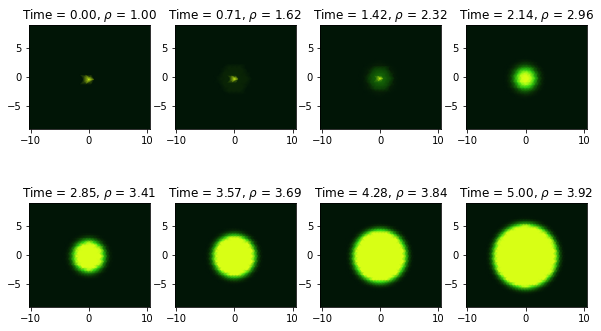

In [49]:
import matplotlib.pyplot as plt
%matplotlib inline

lsig.inspect_max_prop_results(
    res,
    0,
    rows,
    cols,
    vmax=1
)

### Plot maximum propagation vs. density

:Scatter   [rho_0]   (max_area)
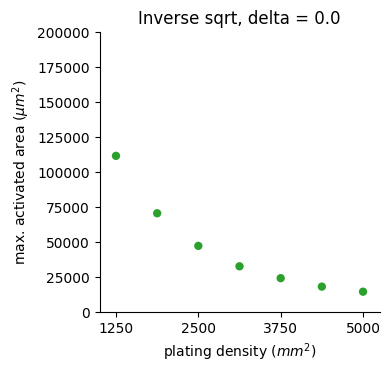

In [50]:
%%capture --no-display

plot = plot.opts(
    title=f"Inverse sqrt, delta = {delta:.1f}",
    ylim=(0, 200000),
)

hv.output(plot, dpi=100)

### Save params

In [51]:
# Save params and plots
dde_args_nocis_isqrt, plot_nocis_isqrt = dde_args, plot

### Save plots and videos

In [52]:
import os

# Set run name
run_name = "test_nocis_isqrt"

# Set directory
dir_name = "plots"

# Set plot filepath and format
fmt = "png"
plot_name = run_name + "_dens_area_plot_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    dde_args[3], dde_args[0], dde_args[1],
) + "." + fmt
plot_path = os.path.join(dir_name, plot_name)

# Set video filename
vid_name = run_name + "_vid_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    dde_args[3], dde_args[0], dde_args[1],
)

In [53]:
%%capture --no-display

hv.save(plot, plot_path, fmt=fmt, dpi=150)

Writing to: plots\test_nocis_isqrt_vid_delta_0.00_irad_3_alpha_3.00_k_1.50e-01


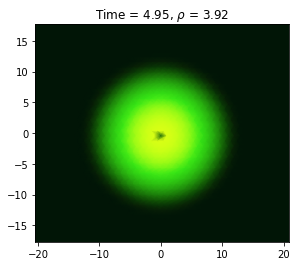

In [58]:
import matplotlib.pyplot as plt
%matplotlib inline


save_vid = False

if save_vid:
    
    # Save colormesh
    lsig.save_max_prop_video(
        res,
        0,
        rows,
        cols,
        vid_name,
        dir_name=dir_name,
        set_xylim="fit",
#         vmax=None,
#         sender_idx=np.nan,
#         vmax_mult_k=1,
#         which_k=1,
    )

<hr>

In [51]:
# Get starting densities
n_rho = 7
rho_0_space = np.linspace(rho_min, rho_max, n_rho)

### Normal feedback, inverse square-root $\beta(\rho)$

In [53]:
# Get RHS
irhs = get_rhs(iAdj, sender_idx, tc_rhs_2a_normA)

# Set new rate parameters
alpha = 3
k = 0.06
p = 2
delta = 3
lambda_ = 1e-5

# Set delay
delay = 0.3

In [54]:
# Set initial fluorescence
S0 = np.zeros(n, dtype=np.float32)
S0[sender_idx] = 1

# Initialize results vector
S_rho0_t = np.empty((n_rho, nt, n), dtype=np.float32)
A_rho0_t = np.empty((n_rho, nt), dtype=np.float32)
rho_rho0_t = np.empty((n_rho, nt), dtype=np.float32)

iterator = range(n_rho)
iterator = tqdm(iterator)
for i in iterator:

    # Get parameters
    rho_0 = rho_0_space[i]
    rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
#     r_t = 1/np.sqrt(rho_t_)
#     ell_t = r_t / np.sqrt(3)

    # Package parameters
    args = (alpha, k, p, delta, lambda_, rho_t_[0])

    # Simulate
    S_t = lsig.integrate_DDE_varargs(
        t,
        irhs,
        var_vals=rho_t_,
        dde_args=args,
        E0=S0,
        delay=delay,
        where_vars=5,
        min_delay=5,
        progress_bar=False,
    )

    S_rho0_t[i] = S_t
    n_act = (S_t > k).sum(axis=1)
    A_rho0_t[i] = A_cells_um(n_act, rho_t_)
    rho_rho0_t[i] = rho_t_

100%|██████████| 7/7 [00:01<00:00,  4.00it/s]


In [79]:
# Select run to animate
run = 0

# Calculate logistic growth
rho_0 = rho_0_space[run]
rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
r_t = 1 / np.sqrt(rho_t_)

# Set window to fixed size
X_t = np.array([X] * nt) * r_t[:, np.newaxis, np.newaxis]
X_fin = X_t[-1]
xlim = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
ylim = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95

# Save for later
run3, X_t3, xlim3, ylim3, rho_t_3, S_rho0_t3, args3, delay3 = (
    run,
    X_t,
    xlim,
    ylim,
    rho_t_,
    S_rho0_t,
    args,
    delay,
)

In [56]:
vmax=S_rho0_t3[:, :, ~sender_idx].max()

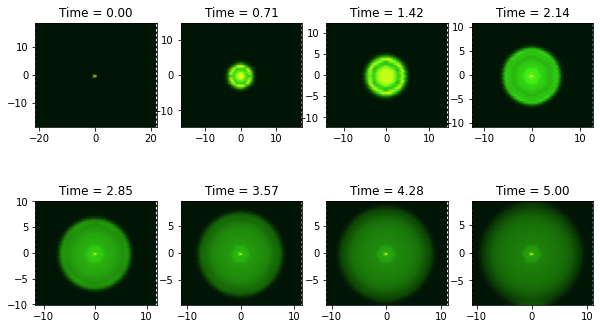

In [57]:
import matplotlib.pyplot as plt
%matplotlib inline

# Set dimensions for a grid of frames
nrows, ncols = 2, 4

# Render frames
nplot = nrows * ncols
idx = [int(i) for i in np.linspace(0, nt-1, nplot)]
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,6))
for ax, i in zip(axs.flat, idx):
    title=f"Time = {t[i]:.2f}"
    lsig.inspect_colormesh(
        ax=ax,
        X=X_t3[i],
        rows=rows,
        cols=cols,
        var=S_rho0_t3[run], 
        idx=i,
        vmin=0, 
        vmax=vmax, 
        cmap="kgy",
#         xlim=xlim,
#         ylim=ylim,
        title=title,
    )

In [58]:
# Get max activated area for each condition
S_max_area = A_rho0_t.max(axis=1)

:Scatter   [rho_0]   (max_area)
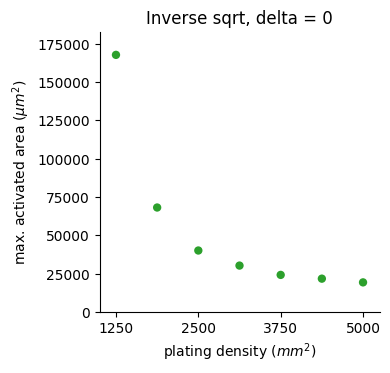

In [59]:
%%capture --no-display

data = {
    "max_area": S_max_area,
    "rho_0": rho_0_space * 1250,
}

p3 = hv.Scatter(
    data=data,
    kdims=["rho_0"], 
    vdims=["max_area"],
).opts(
    color=cc.glasbey_category10[2],
    xlabel=r"plating density ($mm^2$)",
    xlim=(1000, 5250),
    xticks=[1250, 2500, 3750, 5000],
    ylabel=r"max. activated area ($\mu m^2$)",
#     ylim=(   0, 200000),
    ylim=(0,None),
    title="Inverse sqrt, delta = 0"
)

hv.output(p3, dpi=100)

<hr>

In [63]:
def tc_rhs_2a_normA(S, S_delay, Adj, sender_idx, alpha, k, p, delta, lambda_, rho):
    """
    Right-hand side of the transciever circuit delay 
    differential equation. Uses a matrix of cell-cell contact 
    lengths `L`.
    """

    # Get signaling as a function of density
    beta = 1 / np.sqrt(rho)
    
    # Get input signal across each interface
    S_bar = beta * (Adj @ S_delay)

    # Calculate dE/dt
    dS_dt = (
        alpha
        * (S_bar ** p)
        / (k ** p + (delta * S_delay) ** p + S_bar ** p)
        - S
    )

    # Set sender cell to zero
    dS_dt[sender_idx] = 0

    return dS_dt

In [64]:
def get_rhs(Adj, sender_idx, func):
    """Given the indices of sender cells, returns a 
    function `rhs` with call signature 
    rhs(S, S_delay, *args) that can be passed to 
    `lsig.integrate_DDE` and `lsig.integrate_DDE_varargs`.
    """

    def rhs(S, S_delay, *args):
        return func(S, S_delay, Adj, sender_idx, *args)

    return rhs

In [53]:
# Get RHS
irhs = get_rhs(iAdj, sender_idx, tc_rhs_2a_normA)

In [53]:
# Get RHS
rhs = lsig.get_DDE_rhs(tc_rhs_beta_normA, iAdj, sender_idx, )

<hr>

__Set time and growth parameters__

In [51]:
# Set min and max density
rho_min, rho_max = 1, 4

In [51]:
# Get starting densities
n_rho = 7
rho_0_space = np.linspace(rho_min, rho_max, n_rho)

### Normal feedback, inverse square-root $\beta(\rho)$

In [53]:
# Get RHS
irhs = get_rhs(iAdj, sender_idx, tc_rhs_2a_normA)

# Set new rate parameters
alpha = 3
k = 0.06
p = 2
delta = 3
lambda_ = 1e-5

# Set delay
delay = 0.3

In [54]:
# Set initial fluorescence
S0 = np.zeros(n, dtype=np.float32)
S0[sender_idx] = 1

# Initialize results vector
S_rho0_t = np.empty((n_rho, nt, n), dtype=np.float32)
A_rho0_t = np.empty((n_rho, nt), dtype=np.float32)

iterator = range(n_rho)
iterator = tqdm(iterator)
for i in iterator:

    # Get parameters
    rho_0 = rho_0_space[i]
    rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
#     r_t = 1/np.sqrt(rho_t_)
#     ell_t = r_t / np.sqrt(3)

    # Package parameters
    args = (alpha, k, p, delta, lambda_, rho_t_[0])

    # Simulate
    S_t = lsig.integrate_DDE_varargs(
        t,
        irhs,
        var_vals=rho_t_,
        dde_args=args,
        E0=S0,
        delay=delay,
        where_vars=5,
        min_delay=5,
        progress_bar=False,
    )

    S_rho0_t[i] = S_t
    n_act = (S_t > k).sum(axis=1)
    A_rho0_t[i] = A_cells_um(n_act, rho_t_)

100%|██████████| 7/7 [00:01<00:00,  4.00it/s]


In [55]:
# Select run to animate
run = 0

# Calculate logistic growth
rho_0 = rho_0_space[run]
rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
r_t = 1/np.sqrt(rho_t_)

# Set window to fixed size
X_t = (np.array([X] * nt) * r_t[:, np.newaxis, np.newaxis])
X_fin = X_t[-1]
xlim = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
ylim = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95

# Save for later
run3, X_t3, xlim3, ylim3, rho_t_3, S_rho0_t3, args3, delay3 = run, X_t, xlim, ylim, rho_t_, S_rho0_t, args, delay

In [56]:
vmax=S_rho0_t3[:, :, ~sender_idx].max()

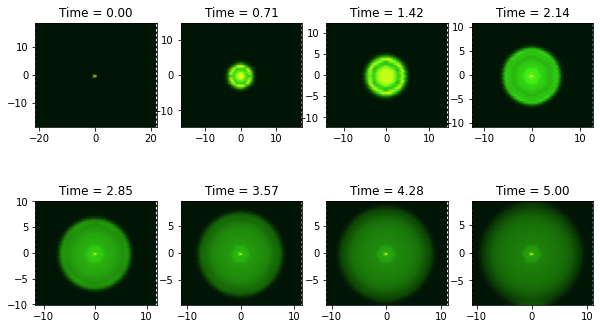

In [57]:
import matplotlib.pyplot as plt
%matplotlib inline

# Set dimensions for a grid of frames
nrows, ncols = 2, 4

# Render frames
nplot = nrows * ncols
idx = [int(i) for i in np.linspace(0, nt-1, nplot)]
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,6))
for ax, i in zip(axs.flat, idx):
    title=f"Time = {t[i]:.2f}"
    lsig.inspect_colormesh(
        ax=ax,
        X=X_t3[i],
        rows=rows,
        cols=cols,
        var=S_rho0_t3[run], 
        idx=i,
        vmin=0, 
        vmax=vmax, 
        cmap="kgy",
#         xlim=xlim,
#         ylim=ylim,
        title=title,
    )

In [58]:
# Get max activated area for each condition
S_max_area = A_rho0_t.max(axis=1)

:Scatter   [rho_0]   (max_area)
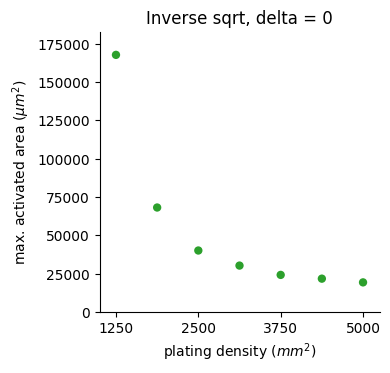

In [59]:
%%capture --no-display

data = {
    "max_area": S_max_area,
    "rho_0": rho_0_space * 1250,
}

p3 = hv.Scatter(
    data=data,
    kdims=["rho_0"], 
    vdims=["max_area"],
).opts(
    color=cc.glasbey_category10[2],
    xlabel=r"plating density ($mm^2$)",
    xlim=(1000, 5250),
    xticks=[1250, 2500, 3750, 5000],
    ylabel=r"max. activated area ($\mu m^2$)",
#     ylim=(   0, 200000),
    ylim=(0,None),
    title="Inverse sqrt, delta = 3"
)

hv.output(p3, dpi=100)

    Normal feedback
    Inverse sqrt func.
    alpha   = 3
    k       = 0.06
    delta   = 3

<hr>

In [60]:
import os

## Save plots

In [61]:
# # Set filepath and format
# fmt = "png"
# dirname = "plots"
# fname = f"active_area_plot_rhomax_{rho_max:.2f}_rho0_{rho_min:.2f}-{rho_max:.2f}" + "." + fmt

# fpath = os.path.join(dirname, fname)

In [62]:
# %%capture --no-display

# hv.save(p1, fpath, fmt=fmt, dpi=150)

<hr>

### No feedback, inverse square-root $\beta(\rho)$

In [63]:
def tc_rhs_2a_normA(S, S_delay, Adj, sender_idx, alpha, k, p, delta, lambda_, rho):
    """
    Right-hand side of the transciever circuit delay 
    differential equation. Uses a matrix of cell-cell contact 
    lengths `L`.
    """

    # Get signaling as a function of density
    beta = 1 / np.sqrt(rho)
    
    # Get input signal across each interface
    S_bar = beta * (Adj @ S_delay)

    # Calculate dE/dt
    dS_dt = (
        alpha
        * (S_bar ** p)
        / (k ** p + (delta * S_delay) ** p + S_bar ** p)
        - S
    )

    # Set sender cell to zero
    dS_dt[sender_idx] = 0

    return dS_dt


def get_rhs(Adj, sender_idx, func):
    """Given the indices of sender cells, returns a 
    function `rhs` with call signature 
    rhs(S, S_delay, *args) that can be passed to 
    `lsig.integrate_DDE` and `lsig.integrate_DDE_varargs`.
    """

    def rhs(S, S_delay, *args):
        return func(S, S_delay, Adj, sender_idx, *args)

    return rhs

In [64]:
# Make normalized Adjacency matrix (row-stochastic)
iAdj = irad_Adj(X, coeff * r + 0.05)
iAdj = csr_matrix(np.divide(iAdj, (iAdj @ np.ones(n))[:, np.newaxis]))

In [65]:
# Set sender cell
sender_idx = lsig.get_center_cells(X)

# Get RHS
irhs = get_rhs(iAdj, sender_idx, tc_rhs_2a_normA)

In [66]:
# Set new rate parameters
alpha = 3
k = 0.12
p = 2
delta = 0
lambda_ = 1e-5

# Set delay
delay = 0.3

In [67]:
# Set initial fluorescence
S0 = np.zeros(n, dtype=np.float32)
S0[sender_idx] = 1

# Initialize results vector
S_rho0_t = np.empty((n_rho, nt, n), dtype=np.float32)
A_rho0_t = np.empty((n_rho, nt), dtype=np.float32)

iterator = range(n_rho)
iterator = tqdm(iterator)
for i in iterator:

    # Get parameters
    rho_0 = rho_0_space[i]
    rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
#     r_t = 1/np.sqrt(rho_t_)
#     ell_t = r_t / np.sqrt(3)

    # Package parameters
    args = (alpha, k, p, delta, lambda_, rho_t_[0])

    # Simulate
    S_t = lsig.integrate_DDE_varargs(
        t,
        irhs,
        var_vals=rho_t_,
        dde_args=args,
        E0=S0,
        delay=delay,
        where_vars=5,
        min_delay=5,
        progress_bar=False,
    )

    S_rho0_t[i] = S_t
    n_act = (S_t > k).sum(axis=1)
    A_rho0_t[i] = A_cells_um(n_act, rho_t_)

100%|██████████| 7/7 [00:00<00:00, 10.55it/s]


In [68]:
# Select run to animate
run = 0

# Calculate logistic growth
rho_0 = rho_0_space[run]
rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
r_t = 1/np.sqrt(rho_t_)

# Set window to fixed size
X_t = (np.array([X] * nt) * r_t[:, np.newaxis, np.newaxis])
X_fin = X_t[-1]
xlim = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
ylim = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95

# Save for later
run3, X_t3, xlim3, ylim3, rho_t_3, S_rho0_t3, args3, delay3 = run, X_t, xlim, ylim, rho_t_, S_rho0_t, args, delay

In [69]:
vmax=S_rho0_t3[:, :, ~sender_idx].max()

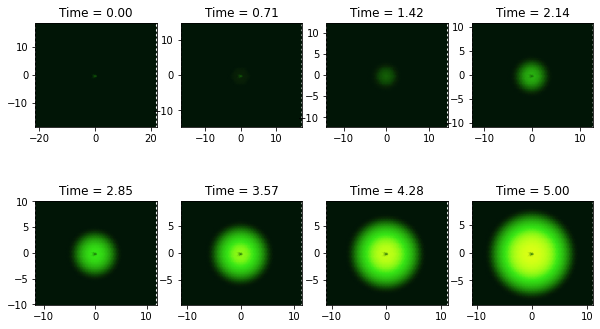

In [70]:
import matplotlib.pyplot as plt
%matplotlib inline

# Set dimensions for a grid of frames
nrows, ncols = 2, 4

# Render frames
nplot = nrows * ncols
idx = [int(i) for i in np.linspace(0, nt-1, nplot)]
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,6))
for ax, i in zip(axs.flat, idx):
    title=f"Time = {t[i]:.2f}"
    lsig.inspect_colormesh(
        ax=ax,
        X=X_t3[i],
        rows=rows,
        cols=cols,
        var=S_rho0_t3[run], 
        idx=i,
        vmin=0, 
        vmax=vmax, 
        cmap="kgy",
#         xlim=xlim,
#         ylim=ylim,
        title=title,
    )

In [71]:
# Get max activated area for each condition
S_max_area = A_rho0_t.max(axis=1)

:Scatter   [rho_0]   (max_area)
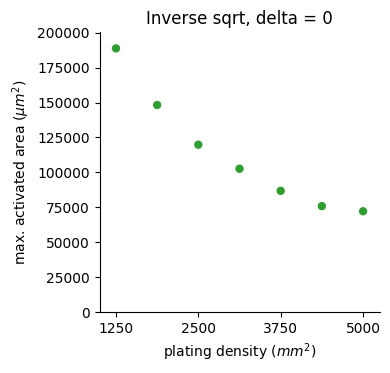

In [72]:
%%capture --no-display

data = {
    "max_area": S_max_area,
    "rho_0": rho_0_space * 1250,
}

p3 = hv.Scatter(
    data=data,
    kdims=["rho_0"], 
    vdims=["max_area"],
).opts(
    color=cc.glasbey_category10[2],
    xlabel=r"plating density ($mm^2$)",
    xlim=(1000, 5250),
    xticks=[1250, 2500, 3750, 5000],
    ylabel=r"max. activated area ($\mu m^2$)",
#     ylim=(   0, 200000),
    ylim=(0,None),
    title="Inverse sqrt, delta = 0"
)

hv.output(p3, dpi=100)

:NdOverlay   [plating density]
   :Curve   [t]   (area_t,plating density)
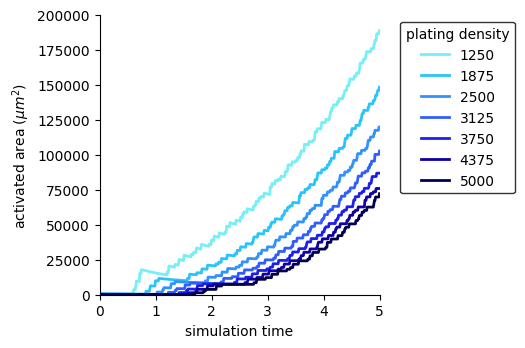

In [73]:
%%capture --no-display

# Set color cycle
cycle = lsig.sample_cycle(cc.kbc[-20::-1], n_rho)


data = {
    "t": np.tile(t, n_rho),
    "area_t": A_rho0_t.flatten(),
    "plating density": np.repeat(rho_0_space, nt) * 1250,
}

p3curve = hv.Curve(
    data=data,
    kdims=["t"], 
    vdims=["area_t", "plating density"],
).groupby(
    "plating density"
).opts(
    xlabel="simulation time",
    ylabel=r"activated area ($\mu m^2$)",
#     ylim=(0,None)
).overlay(
).opts(
    ylim=(   0, 200000),
    legend_position="right",
#     legend_label=r"plating density ($mm^2$)",
).options(
    {"Curve": dict(color=cycle)}
)

hv.output(p3curve, dpi=100)

<hr>

### No feedback, exponential $\beta(\rho)$

In [34]:
@numba.njit
def beta_rho_exp(rho, m):
    return np.exp(-m * (rho - 1))

In [35]:
def tc_rhs_2a_normA_exp(S, S_delay, Adj, sender_idx, alpha, k, p, delta, lambda_, rho, m):
    """
    Right-hand side of the transciever circuit delay 
    differential equation. Uses a matrix of cell-cell contact 
    lengths `L`.
    """

    # Get signaling as a function of density
    beta = beta_rho_exp(rho, m)
    
    # Get input signal across each interface
    S_bar = beta * (Adj @ S_delay)

    # Calculate dE/dt
    dS_dt = (
        alpha
        * (S_bar ** p)
        / (k ** p + (delta * S_delay) ** p + S_bar ** p)
        - S
    )

    # Set sender cell to zero
    dS_dt[sender_idx] = 0

    return dS_dt


def get_rhs(Adj, sender_idx, func):
    """Given the indices of sender cells, returns a 
    function `rhs` with call signature 
    rhs(S, S_delay, *args) that can be passed to 
    `lsig.integrate_DDE` and `lsig.integrate_DDE_varargs`.
    """

    def rhs(S, S_delay, *args):
        return func(S, S_delay, Adj, sender_idx, *args)

    return rhs

In [36]:
irhs = get_rhs(iAdj, sender_idx, tc_rhs_2a_normA_exp)

In [37]:
# Set new rate parameters
alpha = 3
k = 0.02
p = 2
delta = 0
lambda_ = 1e-5
m_exp = 2

# Set delay
delay = 0.3

In [38]:
# Set initial fluorescence
S0 = np.zeros(n, dtype=np.float32)
S0[sender_idx] = 1

# Initialize results vector
S_rho0_t = np.empty((n_rho, nt, n), dtype=np.float32)
A_rho0_t = np.empty((n_rho, nt), dtype=np.float32)

iterator = range(n_rho)
iterator = tqdm(iterator)
for i in iterator:

    # Get parameters
    rho_0 = rho_0_space[i]
    rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
#     r_t = 1/np.sqrt(rho_t_)
#     ell_t = r_t / np.sqrt(3)

    # Package parameters
    args = (alpha, k, p, delta, lambda_, rho_t_[0], m_exp)

    # Simulate
    S_t = lsig.integrate_DDE_varargs(
        t,
        irhs,
        var_vals=rho_t_,
        dde_args=args,
        E0=S0,
        delay=delay,
        where_vars=5,
        min_delay=5,
        progress_bar=False,
    )

    S_rho0_t[i] = S_t
    n_act = (S_t > k).sum(axis=1)
    A_rho0_t[i] = A_cells_um(n_act, rho_t_)

100%|██████████| 7/7 [00:00<00:00,  9.80it/s]


In [39]:
# Select run to animate
run = 0

# Calculate logistic growth
rho_0 = rho_0_space[run]
rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
r_t = 1/np.sqrt(rho_t_)

# Set window to fixed size
X_t = (np.array([X] * nt) * r_t[:, np.newaxis, np.newaxis])
X_fin = X_t[-1]
xlim = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
ylim = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95

# Save for later
run3, X_t3, xlim3, ylim3, rho_t_3, S_rho0_t3, args3, delay3 = run, X_t, xlim, ylim, rho_t_, S_rho0_t, args, delay

In [40]:
vmax=S_rho0_t3[:, :, ~sender_idx].max()

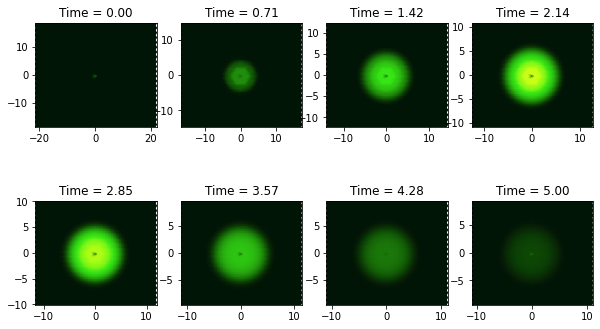

In [41]:
import matplotlib.pyplot as plt
%matplotlib inline

# Set dimensions for a grid of frames
nrows, ncols = 2, 4

# Render frames
nplot = nrows * ncols
idx = [int(i) for i in np.linspace(0, nt-1, nplot)]
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,6))
for ax, i in zip(axs.flat, idx):
    title=f"Time = {t[i]:.2f}"
    lsig.inspect_colormesh(
        ax=ax,
        X=X_t3[i],
        rows=rows,
        cols=cols,
        var=S_rho0_t3[run], 
        idx=i,
        vmin=0, 
        vmax=vmax, 
        cmap="kgy",
#         xlim=xlim,
#         ylim=ylim,
        title=title,
    )

In [42]:
# Get max activated area for each condition
S_max_area = A_rho0_t.max(axis=1)

:Scatter   [rho_0]   (max_area)
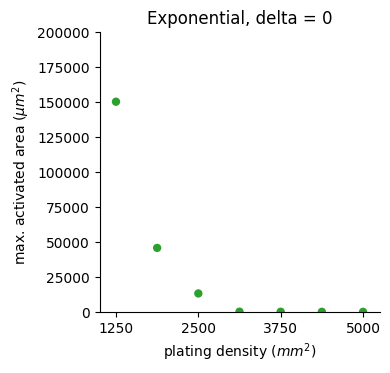

In [43]:
%%capture --no-display

data = {
    "max_area": S_max_area,
    "rho_0": rho_0_space * 1250,
}

p3 = hv.Scatter(
    data=data,
    kdims=["rho_0"], 
    vdims=["max_area"],
).opts(
    color=cc.glasbey_category10[2],
    xlabel=r"plating density ($mm^2$)",
    xlim=(1000, 5250),
    xticks=[1250, 2500, 3750, 5000],
    ylabel=r"max. activated area ($\mu m^2$)",
    ylim=(   0, 200000),
#     ylim=(0,None),
    title="Exponential, delta = 0"
)

hv.output(p3, dpi=100)

:NdOverlay   [plating density]
   :Curve   [t]   (area_t,plating density)
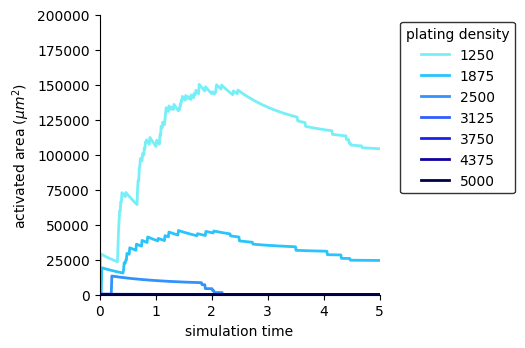

In [44]:
%%capture --no-display

# Set color cycle
cycle = lsig.sample_cycle(cc.kbc[-20::-1], n_rho)


data = {
    "t": np.tile(t, n_rho),
    "area_t": A_rho0_t.flatten(),
    "plating density": np.repeat(rho_0_space, nt) * 1250,
}

p3curve = hv.Curve(
    data=data,
    kdims=["t"], 
    vdims=["area_t", "plating density"],
).groupby(
    "plating density"
).opts(
    xlabel="simulation time",
    ylabel=r"activated area ($\mu m^2$)",
#     ylim=(0,None)
).overlay(
).opts(
    ylim=(   0, 200000),
    legend_position="right",
#     legend_label=r"plating density ($mm^2$)",
).options(
    {"Curve": dict(color=cycle)}
)

hv.output(p3curve, dpi=100)

In [ ]:
    No feedback
    Exponential func.
    alpha   = 3
    k       = 0.02
    delta   = 0
    m_exp   = 2

## Save plots

In [45]:
# Set filepath and format
fmt = "png"
dirname = "plots"
fname = "exponential_dens_area_plot_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    args3[3], args3[0], args3[1],
) + "." + fmt

fpath = os.path.join(dirname, fname)

In [46]:
%%capture --no-display

hv.save(p3, fpath, fmt=fmt, dpi=150)

## Save video

In [47]:
# Set directory
dir_name = "plots"

# Set filenames
vid3_fname = "exponential_vid_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    args3[3], args3[0], args3[1],
)


Writing to: plots\exponential_vid_delta_0.00_irad_3_alpha_3.00_k_2.00e-02


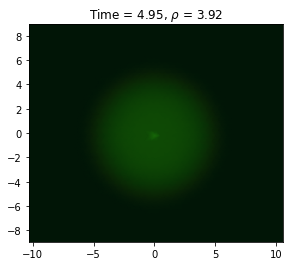

In [48]:
# Function for plot title
title_fun = lambda i: f"Time = {t[i]:.2f}, " + r"$\rho$" + f" = {rho_t_3[i]:.2f}"
lsig.animate_colormesh(
    X_arr=X_t3,
    rows=rows,
    cols=cols,
    var_t=S_rho0_t3[run3],
    n_frames=100,
    file_name=vid3_fname,
    dir_name=dir_name,
    fps=15, 
    vmin=0, 
    vmax=vmax, 
    cmap="kgy",
    title_fun=title_fun,
    xlim=xlim3,
    ylim=ylim3,
)

<hr>

:Curve   [x]   (y)
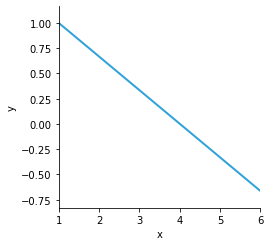

In [86]:
# %%capture --no-display

# rho_samples = np.linspace(1, 6)
# # data = pd.DataFrame({
# #     "rho":  np.tile(rho_samples, 3),
# #     "func": 
# # })

# c1 = hv.Curve(
#     (rho_samples, beta_rho_lin(rho_samples, m_lin))
# )

# c3 = hv.Curve(
#     (rho_samples, beta_rho_lin(rho_samples, m_lin)),
#     label=""

# c1

<hr>

### No feedback, linear $\beta(\rho)$

In [74]:
@numba.njit
def beta_rho_lin(rho, m):
    return m - m * rho + 1

In [75]:
def tc_rhs_2a_normA_lin(S, S_delay, Adj, sender_idx, alpha, k, p, delta, lambda_, rho, m):
    """
    Right-hand side of the transciever circuit delay 
    differential equation. Uses a matrix of cell-cell contact 
    lengths `L`.
    """

    # Get signaling as a function of density
    beta = beta_rho_lin(rho, m)
    
    # Get input signal across each interface
    S_bar = beta * (Adj @ S_delay)

    # Calculate dE/dt
    dS_dt = (
        alpha
        * (S_bar ** p)
        / (k ** p + (delta * S_delay) ** p + S_bar ** p)
        - S
    )

    # Set sender cell to zero
    dS_dt[sender_idx] = 0

    return dS_dt


def get_rhs(Adj, sender_idx, func):
    """Given the indices of sender cells, returns a 
    function `rhs` with call signature 
    rhs(S, S_delay, *args) that can be passed to 
    `lsig.integrate_DDE` and `lsig.integrate_DDE_varargs`.
    """

    def rhs(S, S_delay, *args):
        return func(S, S_delay, Adj, sender_idx, *args)

    return rhs

In [76]:
# Get RHS
irhs = get_rhs(iAdj, sender_idx, tc_rhs_2a_normA_lin)

In [77]:
# Set new rate parameters
alpha = 3
k = 0.02
p = 2
delta = 0
lambda_ = 1e-5
m_lin = 0.333

# Set delay
delay = 0.3

In [78]:
# Set initial fluorescence
S0 = np.zeros(n, dtype=np.float32)
S0[sender_idx] = 1

# Initialize results vector
S_rho0_t = np.empty((n_rho, nt, n), dtype=np.float32)
A_rho0_t = np.empty((n_rho, nt), dtype=np.float32)

iterator = range(n_rho)
iterator = tqdm(iterator)
for i in iterator:

    # Get parameters
    rho_0 = rho_0_space[i]
    rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
#     r_t = 1/np.sqrt(rho_t_)
#     ell_t = r_t / np.sqrt(3)

    # Package parameters
    args = (alpha, k, p, delta, lambda_, rho_t_[0], m_lin)

    # Simulate
    S_t = lsig.integrate_DDE_varargs(
        t,
        irhs,
        var_vals=rho_t_,
        dde_args=args,
        E0=S0,
        delay=delay,
        where_vars=5,
        min_delay=5,
        progress_bar=False,
    )

    S_rho0_t[i] = S_t
    n_act = (S_t > k).sum(axis=1)
    A_rho0_t[i] = A_cells_um(n_act, rho_t_)

100%|██████████| 7/7 [00:00<00:00,  9.72it/s]


In [79]:
# Select run to animate
run = 0

# Calculate logistic growth
rho_0 = rho_0_space[run]
rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
r_t = 1/np.sqrt(rho_t_)

# Set window to fixed size
X_t = (np.array([X] * nt) * r_t[:, np.newaxis, np.newaxis])
X_fin = X_t[-1]
xlim = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
ylim = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95

# Save for later
run3, X_t3, xlim3, ylim3, rho_t_3, S_rho0_t3, args3, delay3 = run, X_t, xlim, ylim, rho_t_, S_rho0_t, args, delay

In [80]:
vmax=S_rho0_t3[:, :, ~sender_idx].max()

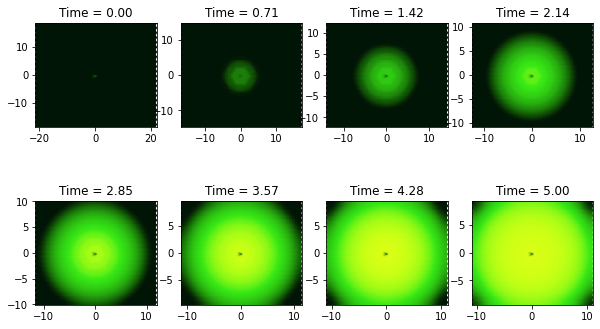

In [81]:
import matplotlib.pyplot as plt
%matplotlib inline

# Set dimensions for a grid of frames
nrows, ncols = 2, 4

# Render frames
nplot = nrows * ncols
idx = [int(i) for i in np.linspace(0, nt-1, nplot)]
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,6))
for ax, i in zip(axs.flat, idx):
    title=f"Time = {t[i]:.2f}"
    lsig.inspect_colormesh(
        ax=ax,
        X=X_t3[i],
        rows=rows,
        cols=cols,
        var=S_rho0_t3[run], 
        idx=i,
        vmin=0, 
        vmax=vmax, 
        cmap="kgy",
#         xlim=xlim,
#         ylim=ylim,
        title=title,
    )

In [82]:
# Get max activated area for each condition
S_max_area = A_rho0_t.max(axis=1)

:Scatter   [rho_0]   (max_area)
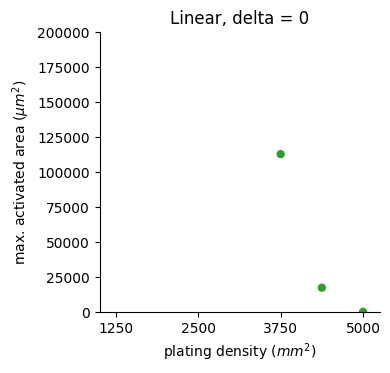

In [83]:
%%capture --no-display

data = {
    "max_area": S_max_area,
    "rho_0": rho_0_space * 1250,
}

p3 = hv.Scatter(
    data=data,
    kdims=["rho_0"], 
    vdims=["max_area"],
).opts(
    color=cc.glasbey_category10[2],
    xlabel=r"plating density ($mm^2$)",
    xlim=(1000, 5250),
    xticks=[1250, 2500, 3750, 5000],
    ylabel=r"max. activated area ($\mu m^2$)",
    ylim=(   0, 200000),
#     ylim=(0,None)
    title="Linear, delta = 0"
)

hv.output(p3, dpi=100)

:NdOverlay   [plating density]
   :Curve   [t]   (area_t,plating density)
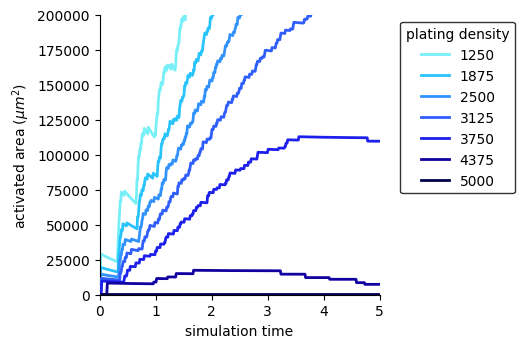

In [84]:
%%capture --no-display

# Set color cycle
cycle = lsig.sample_cycle(cc.kbc[-20::-1], n_rho)


data = {
    "t": np.tile(t, n_rho),
    "area_t": A_rho0_t.flatten(),
    "plating density": np.repeat(rho_0_space, nt) * 1250,
}

p3curve = hv.Curve(
    data=data,
    kdims=["t"], 
    vdims=["area_t", "plating density"],
).groupby(
    "plating density"
).opts(
    xlabel="simulation time",
    ylabel=r"activated area ($\mu m^2$)",
#     ylim=(0,None)
).overlay(
).opts(
    ylim=(   0, 200000),
    legend_position="right",
#     legend_label=r"plating density ($mm^2$)",
).options(
    {"Curve": dict(color=cycle)}
)

hv.output(p3curve, dpi=100)

    No feedback
    Linear func.
    alpha   = 3
    k       = 0.02
    delta   = 0
    m_lin = 0.333

## Save plots

In [60]:
# Set filepath and format
fmt = "png"
dirname = "plots"
fname = "linear_dens_area_plot_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    args3[3], args3[0], args3[1],
) + "." + fmt

fpath = os.path.join(dirname, fname)

In [61]:
%%capture --no-display

hv.save(p3, fpath, fmt=fmt, dpi=150)

## Save video

In [62]:
# Set directory
dir_name = "plots"

# Set filenames
vid3_fname = "linear_vid_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    args3[3], args3[0], args3[1],
)


Writing to: plots\linear_vid_delta_0.00_irad_3_alpha_3.00_k_2.00e-02


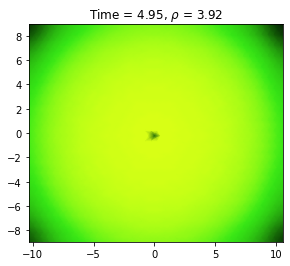

In [63]:
# Function for plot title
title_fun = lambda i: f"Time = {t[i]:.2f}, " + r"$\rho$" + f" = {rho_t_3[i]:.2f}"
lsig.animate_colormesh(
    X_arr=X_t3,
    rows=rows,
    cols=cols,
    var_t=S_rho0_t3[run3],
    n_frames=100,
    file_name=vid3_fname,
    dir_name=dir_name,
    fps=15, 
    vmin=0, 
    vmax=vmax, 
    cmap="kgy",
    title_fun=title_fun,
    xlim=xlim3,
    ylim=ylim3,
)

<hr>

### Reduced feedback, inverse square-root $\beta(\rho)$

In [124]:
# Get RHS
irhs = get_rhs(iAdj, sender_idx, tc_rhs_2a_normA)

In [125]:
# Set new rate parameters
alpha = 3
k = 0.12
p = 2
delta = 1
lambda_ = 1e-5

# Set delay
delay = 0.3

In [126]:
# Set initial fluorescence
S0 = np.zeros(n, dtype=np.float32)
S0[sender_idx] = 1

# Initialize results vector
S_rho0_t = np.empty((n_rho, nt, n), dtype=np.float32)
A_rho0_t = np.empty((n_rho, nt), dtype=np.float32)

iterator = range(n_rho)
iterator = tqdm(iterator)
for i in iterator:

    # Get parameters
    rho_0 = rho_0_space[i]
    rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
#     r_t = 1/np.sqrt(rho_t_)
#     ell_t = r_t / np.sqrt(3)

    # Package parameters
    args = (alpha, k, p, delta, lambda_, rho_t_[0])

    # Simulate
    S_t = lsig.integrate_DDE_varargs(
        t,
        irhs,
        var_vals=rho_t_,
        dde_args=args,
        E0=S0,
        delay=delay,
        where_vars=5,
        min_delay=5,
        progress_bar=False,
    )

    S_rho0_t[i] = S_t
    n_act = (S_t > k).sum(axis=1)
    A_rho0_t[i] = A_cells_um(n_act, rho_t_)

100%|██████████| 7/7 [00:00<00:00,  9.26it/s]


In [127]:
# Select run to animate
run = 0

# Calculate logistic growth
rho_0 = rho_0_space[run]
rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
r_t = 1/np.sqrt(rho_t_)

# Set window to fixed size
X_t = (np.array([X] * nt) * r_t[:, np.newaxis, np.newaxis])
X_fin = X_t[-1]
xlim = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
ylim = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95

# Save for later
run3, X_t3, xlim3, ylim3, rho_t_3, S_rho0_t3, args3, delay3 = run, X_t, xlim, ylim, rho_t_, S_rho0_t, args, delay

In [128]:
vmax=S_rho0_t3[:, :, ~sender_idx].max()

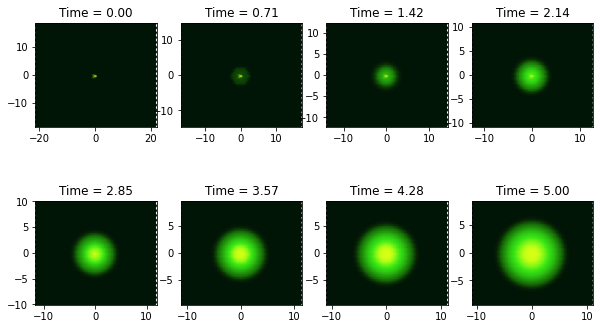

In [129]:
import matplotlib.pyplot as plt
%matplotlib inline

# Set dimensions for a grid of frames
nrows, ncols = 2, 4

# Render frames
nplot = nrows * ncols
idx = [int(i) for i in np.linspace(0, nt-1, nplot)]
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,6))
for ax, i in zip(axs.flat, idx):
    title=f"Time = {t[i]:.2f}"
    lsig.inspect_colormesh(
        ax=ax,
        X=X_t3[i],
        rows=rows,
        cols=cols,
        var=S_rho0_t3[run], 
        idx=i,
        vmin=0, 
        vmax=vmax, 
        cmap="kgy",
#         xlim=xlim,
#         ylim=ylim,
        title=title,
    )

In [130]:
# Get max activated area for each condition
S_max_area = A_rho0_t.max(axis=1)

:Scatter   [rho_0]   (max_area)
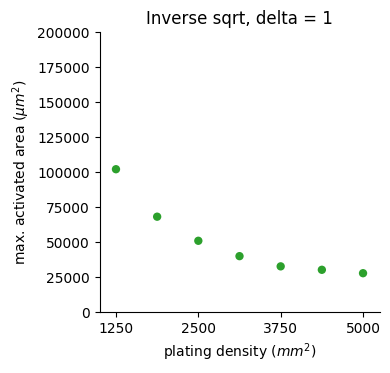

In [131]:
%%capture --no-display

data = {
    "max_area": S_max_area,
    "rho_0": rho_0_space * 1250,
}

p3 = hv.Scatter(
    data=data,
    kdims=["rho_0"], 
    vdims=["max_area"],
).opts(
    color=cc.glasbey_category10[2],
    xlabel=r"plating density ($mm^2$)",
    xlim=(1000, 5250),
    xticks=[1250, 2500, 3750, 5000],
    ylabel=r"max. activated area ($\mu m^2$)",
    ylim=(   0, 200000),
#     ylim=(0,None),
    title="Inverse sqrt, delta = 1"
)

hv.output(p3, dpi=100)

:NdOverlay   [plating density]
   :Curve   [t]   (area_t,plating density)
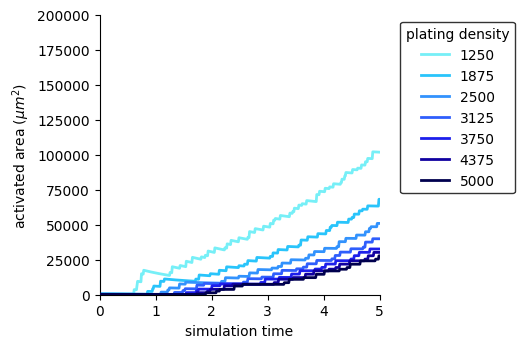

In [132]:
%%capture --no-display

# Set color cycle
cycle = lsig.sample_cycle(cc.kbc[-20::-1], n_rho)


data = {
    "t": np.tile(t, n_rho),
    "area_t": A_rho0_t.flatten(),
    "plating density": np.repeat(rho_0_space, nt) * 1250,
}

p3curve = hv.Curve(
    data=data,
    kdims=["t"], 
    vdims=["area_t", "plating density"],
).groupby(
    "plating density"
).opts(
    xlabel="simulation time",
    ylabel=r"activated area ($\mu m^2$)",
#     ylim=(0,None)
).overlay(
).opts(
    ylim=(   0, 200000),
    legend_position="right",
#     legend_label=r"plating density ($mm^2$)",
).options(
    {"Curve": dict(color=cycle)}
)

hv.output(p3curve, dpi=100)

<hr>

### Reduced feedback, exponential $\beta(\rho)$

In [72]:
# Get RHS
irhs = get_rhs(iAdj, sender_idx, tc_rhs_2a_normA_exp)

In [73]:
# Set new rate parameters
alpha = 3
k = 0.03
p = 2
delta = 1
lambda_ = 1e-5
m_exp = 1

# Set delay
delay = 0.3

In [74]:
# Set initial fluorescence
S0 = np.zeros(n, dtype=np.float32)
S0[sender_idx] = 1

# Initialize results vector
S_rho0_t = np.empty((n_rho, nt, n), dtype=np.float32)
A_rho0_t = np.empty((n_rho, nt), dtype=np.float32)

iterator = range(n_rho)
iterator = tqdm(iterator)
for i in iterator:

    # Get parameters
    rho_0 = rho_0_space[i]
    rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
#     r_t = 1/np.sqrt(rho_t_)
#     ell_t = r_t / np.sqrt(3)

    # Package parameters
    args = (alpha, k, p, delta, lambda_, rho_t_[0], m_exp)

    # Simulate
    S_t = lsig.integrate_DDE_varargs(
        t,
        irhs,
        var_vals=rho_t_,
        dde_args=args,
        E0=S0,
        delay=delay,
        where_vars=5,
        min_delay=5,
        progress_bar=False,
    )

    S_rho0_t[i] = S_t
    n_act = (S_t > k).sum(axis=1)
    A_rho0_t[i] = A_cells_um(n_act, rho_t_)

100%|██████████| 7/7 [00:00<00:00,  7.62it/s]


In [75]:
# Select run to animate
run = 0

# Calculate logistic growth
rho_0 = rho_0_space[run]
rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
r_t = 1/np.sqrt(rho_t_)

# Set window to fixed size
X_t = (np.array([X] * nt) * r_t[:, np.newaxis, np.newaxis])
X_fin = X_t[-1]
xlim = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
ylim = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95

# Save for later
run3, X_t3, xlim3, ylim3, rho_t_3, S_rho0_t3, args3, delay3 = run, X_t, xlim, ylim, rho_t_, S_rho0_t, args, delay

In [76]:
vmax=S_rho0_t3[:, :, ~sender_idx].max()

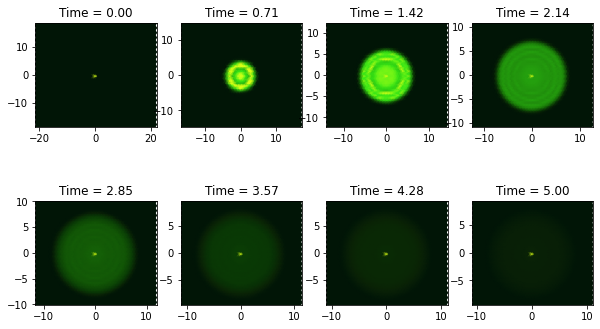

In [77]:
import matplotlib.pyplot as plt
%matplotlib inline

# Set dimensions for a grid of frames
nrows, ncols = 2, 4

# Render frames
nplot = nrows * ncols
idx = [int(i) for i in np.linspace(0, nt-1, nplot)]
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,6))
for ax, i in zip(axs.flat, idx):
    title=f"Time = {t[i]:.2f}"
    lsig.inspect_colormesh(
        ax=ax,
        X=X_t3[i],
        rows=rows,
        cols=cols,
        var=S_rho0_t3[run], 
        idx=i,
        vmin=0, 
        vmax=vmax, 
        cmap="kgy",
#         xlim=xlim,
#         ylim=ylim,
        title=title,
    )

In [78]:
# Get max activated area for each condition
S_max_area = A_rho0_t.max(axis=1)

:Scatter   [rho_0]   (max_area)
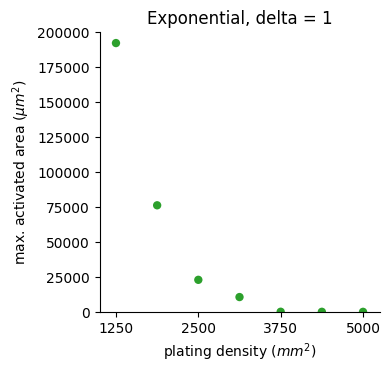

In [79]:
%%capture --no-display

data = {
    "max_area": S_max_area,
    "rho_0": rho_0_space * 1250,
}

p3 = hv.Scatter(
    data=data,
    kdims=["rho_0"], 
    vdims=["max_area"],
).opts(
    color=cc.glasbey_category10[2],
    xlabel=r"plating density ($mm^2$)",
    xlim=(1000, 5250),
    xticks=[1250, 2500, 3750, 5000],
    ylabel=r"max. activated area ($\mu m^2$)",
    ylim=(   0, 200000),
#     ylim=(0,None),
    title="Exponential, delta = 1"
)

hv.output(p3, dpi=100)

:NdOverlay   [plating density]
   :Curve   [t]   (area_t,plating density)
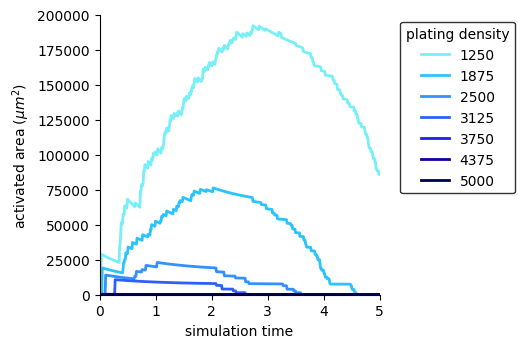

In [80]:
%%capture --no-display

# Set color cycle
cycle = lsig.sample_cycle(cc.kbc[-20::-1], n_rho)


data = {
    "t": np.tile(t, n_rho),
    "area_t": A_rho0_t.flatten(),
    "plating density": np.repeat(rho_0_space, nt) * 1250,
}

p3curve = hv.Curve(
    data=data,
    kdims=["t"], 
    vdims=["area_t", "plating density"],
).groupby(
    "plating density"
).opts(
    xlabel="simulation time",
    ylabel=r"activated area ($\mu m^2$)",
#     ylim=(0,None)
).overlay(
).opts(
    ylim=(   0, 200000),
    legend_position="right",
#     legend_label=r"plating density ($mm^2$)",
).options(
    {"Curve": dict(color=cycle)}
)

hv.output(p3curve, dpi=100)

    Reduced feedback
    Exponential func.
    alpha   = 3
    k       = 0.03
    delta   = 1
    m_exp   = 1.0

## Save plots

In [81]:
# Set filepath and format
fmt = "png"
dirname = "plots"
fname = "exponential_dens_area_plot_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    args3[3], args3[0], args3[1],
) + "." + fmt

fpath = os.path.join(dirname, fname)

In [82]:
%%capture --no-display

hv.save(p3, fpath, fmt=fmt, dpi=150)

## Save video

In [83]:
# Set directory
dir_name = "plots"

# Set filenames
vid3_fname = "exponential_vid_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    args3[3], args3[0], args3[1],
)


Writing to: plots\exponential_vid_delta_1.00_irad_3_alpha_3.00_k_3.00e-02


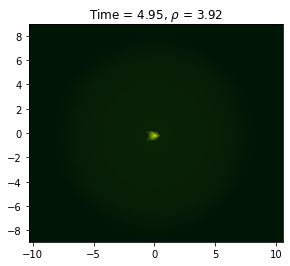

In [84]:
# Function for plot title
title_fun = lambda i: f"Time = {t[i]:.2f}, " + r"$\rho$" + f" = {rho_t_3[i]:.2f}"
lsig.animate_colormesh(
    X_arr=X_t3,
    rows=rows,
    cols=cols,
    var_t=S_rho0_t3[run3],
    n_frames=100,
    file_name=vid3_fname,
    dir_name=dir_name,
    fps=15, 
    vmin=0, 
    vmax=vmax, 
    cmap="kgy",
    title_fun=title_fun,
    xlim=xlim3,
    ylim=ylim3,
)

<hr>

### Reduced feedback, linear $\beta(\rho)$

In [85]:
# Get RHS
irhs = get_rhs(iAdj, sender_idx, tc_rhs_2a_normA_lin)

In [86]:
# Set new rate parameters
alpha = 3
k = 0.03
p = 2
delta = 1
lambda_ = 1e-5
m_lin = 0.333

# Set delay
delay = 0.3

In [87]:
# Set initial fluorescence
S0 = np.zeros(n, dtype=np.float32)
S0[sender_idx] = 1

# Initialize results vector
S_rho0_t = np.empty((n_rho, nt, n), dtype=np.float32)
A_rho0_t = np.empty((n_rho, nt), dtype=np.float32)

iterator = range(n_rho)
iterator = tqdm(iterator)
for i in iterator:

    # Get parameters
    rho_0 = rho_0_space[i]
    rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
#     r_t = 1/np.sqrt(rho_t_)
#     ell_t = r_t / np.sqrt(3)

    # Package parameters
    args = (alpha, k, p, delta, lambda_, rho_t_[0], m_lin)

    # Simulate
    S_t = lsig.integrate_DDE_varargs(
        t,
        irhs,
        var_vals=rho_t_,
        dde_args=args,
        E0=S0,
        delay=delay,
        where_vars=5,
        min_delay=5,
        progress_bar=False,
    )

    S_rho0_t[i] = S_t
    n_act = (S_t > k).sum(axis=1)
    A_rho0_t[i] = A_cells_um(n_act, rho_t_)

100%|██████████| 7/7 [00:00<00:00, 10.38it/s]


In [88]:
# Select run to animate
run = 0

# Calculate logistic growth
rho_0 = rho_0_space[run]
rho_t_ = rho_t(t, rho_0=rho_0, rho_max=rho_max)
r_t = 1/np.sqrt(rho_t_)

# Set window to fixed size
X_t = (np.array([X] * nt) * r_t[:, np.newaxis, np.newaxis])
X_fin = X_t[-1]
xlim = X_fin[:, 0].min() * 0.95, X_fin[:, 0].max() * 0.95
ylim = X_fin[:, 1].min() * 0.95, X_fin[:, 1].max() * 0.95

# Save for later
run3, X_t3, xlim3, ylim3, rho_t_3, S_rho0_t3, args3, delay3 = run, X_t, xlim, ylim, rho_t_, S_rho0_t, args, delay

In [89]:
vmax=S_rho0_t3[:, :, ~sender_idx].max()

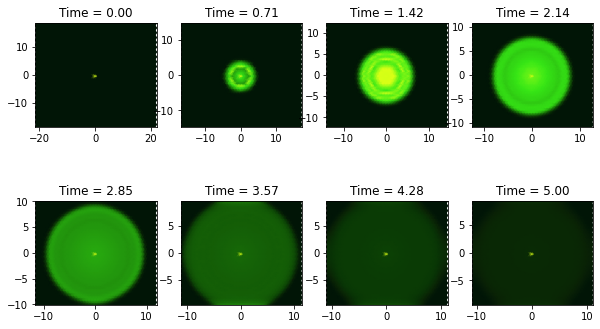

In [90]:
import matplotlib.pyplot as plt
%matplotlib inline

# Set dimensions for a grid of frames
nrows, ncols = 2, 4

# Render frames
nplot = nrows * ncols
idx = [int(i) for i in np.linspace(0, nt-1, nplot)]
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,6))
for ax, i in zip(axs.flat, idx):
    title=f"Time = {t[i]:.2f}"
    lsig.inspect_colormesh(
        ax=ax,
        X=X_t3[i],
        rows=rows,
        cols=cols,
        var=S_rho0_t3[run], 
        idx=i,
        vmin=0, 
        vmax=vmax, 
        cmap="kgy",
#         xlim=xlim,
#         ylim=ylim,
        title=title,
    )

In [91]:
# Get max activated area for each condition
S_max_area = A_rho0_t.max(axis=1)

:Scatter   [rho_0]   (max_area)
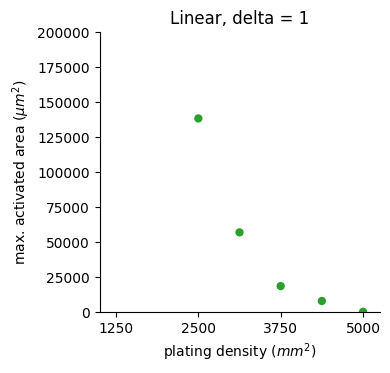

In [92]:
%%capture --no-display

data = {
    "max_area": S_max_area,
    "rho_0": rho_0_space * 1250,
}

p3 = hv.Scatter(
    data=data,
    kdims=["rho_0"], 
    vdims=["max_area"],
).opts(
    color=cc.glasbey_category10[2],
    xlabel=r"plating density ($mm^2$)",
    xlim=(1000, 5250),
    xticks=[1250, 2500, 3750, 5000],
    ylabel=r"max. activated area ($\mu m^2$)",
    ylim=(   0, 200000),
#     ylim=(0,None),
    title="Linear, delta = 1"
)

hv.output(p3, dpi=100)

:NdOverlay   [plating density]
   :Curve   [t]   (area_t,plating density)
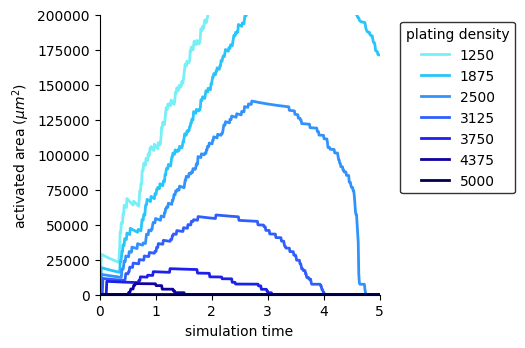

In [93]:
%%capture --no-display

# Set color cycle
cycle = lsig.sample_cycle(cc.kbc[-20::-1], n_rho)


data = {
    "t": np.tile(t, n_rho),
    "area_t": A_rho0_t.flatten(),
    "plating density": np.repeat(rho_0_space, nt) * 1250,
}

p3curve = hv.Curve(
    data=data,
    kdims=["t"], 
    vdims=["area_t", "plating density"],
).groupby(
    "plating density"
).opts(
    xlabel="simulation time",
    ylabel=r"activated area ($\mu m^2$)",
#     ylim=(0,None)
).overlay(
).opts(
    ylim=(   0, 200000),
    legend_position="right",
#     legend_label=r"plating density ($mm^2$)",
).options(
    {"Curve": dict(color=cycle)}
)

hv.output(p3curve, dpi=100)

    Reduced feedback
    Linear func.
    alpha   = 3
    k       = 0.03
    delta   = 1
    m_lin = 0.333

## Save plots

In [94]:
# Set filepath and format
fmt = "png"
dirname = "plots"
fname = "linear_dens_area_plot_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    args3[3], args3[0], args3[1],
) + "." + fmt

fpath = os.path.join(dirname, fname)

In [95]:
%%capture --no-display

hv.save(p3, fpath, fmt=fmt, dpi=150)

## Save video

In [96]:
# Set directory
dir_name = "plots"

# Set filenames
vid3_fname = "linear_vid_delta_{0:.2f}_irad_3_alpha_{1:.2f}_k_{2:.2e}".format(
    args3[3], args3[0], args3[1],
)


Writing to: plots\linear_vid_delta_1.00_irad_3_alpha_3.00_k_3.00e-02


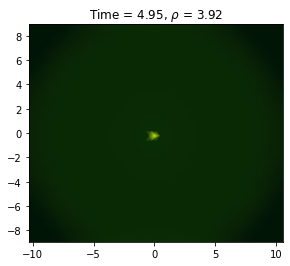

In [97]:
# Function for plot title
title_fun = lambda i: f"Time = {t[i]:.2f}, " + r"$\rho$" + f" = {rho_t_3[i]:.2f}"
lsig.animate_colormesh(
    X_arr=X_t3,
    rows=rows,
    cols=cols,
    var_t=S_rho0_t3[run3],
    n_frames=100,
    file_name=vid3_fname,
    dir_name=dir_name,
    fps=15, 
    vmin=0, 
    vmax=vmax, 
    cmap="kgy",
    title_fun=title_fun,
    xlim=xlim3,
    ylim=ylim3,
)

<hr>

In [98]:
%load_ext watermark

In [99]:
%watermark -v -p numpy,scipy,numba,holoviews,jupyterlab

CPython 3.7.7
IPython 7.18.1

numpy 1.18.1
scipy 1.4.1
numba 0.51.2
holoviews 1.13.2
jupyterlab 1.2.6
